## Capstone_Project_01

## Mercedez Benz Greener Manufacturing 
Since the first automobile, the Benz Patent Motor Car in 1886, Mercedes-Benz has stood for important automotive innovations. These include, for example, the passenger safety cell with crumple zone, the airbag and intelligent assistance systems. Mercedes-Benz applies for nearly 2000 patents per year, making the brand the European leader among premium car makers. Daimler’s Mercedes-Benz cars are leaders in the premium car industry. With a huge selection of features and options, customers can choose the customized Mercedes-Benz of their dreams. .

To ensure the safety and reliability of each and every unique car configuration before they hit the road, Daimler’s engineers have developed a robust testing system. But, optimizing the speed of their testing system for so many possible feature combinations is complex and time-consuming without a powerful algorithmic approach. As one of the world’s biggest manufacturers of premium cars, safety and efficiency are paramount on Daimler’s production lines.



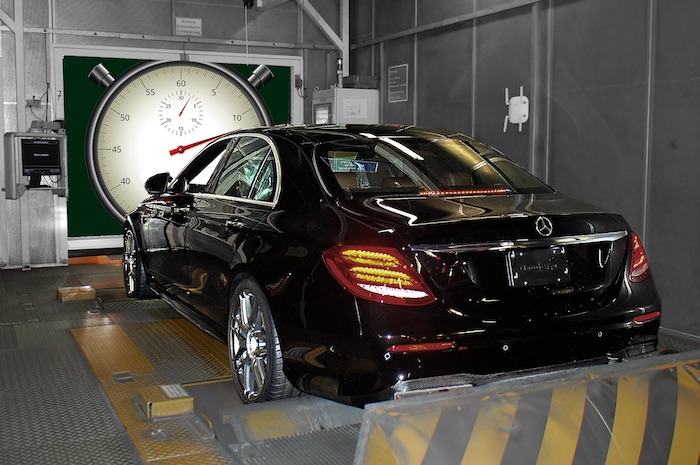

## Aim : To Predict time taken to pass testing

Importing Standard Libraries 

In [1]:
import os
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
os.listdir()

['.config', 'drive', 'sample_data']

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import explained_variance_score,mean_absolute_error
from sklearn.preprocessing import StandardScaler
file="/content/drive/MyDrive/Mercedez_Benz_Capstone/train/train.csv"
df=pd.read_csv(file)
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [5]:
df.head()

,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X26,X27,X28,X29,X30,X31,X32,X33,X34,X35,X36,X37,X38,X39,X40,...,X345,X346,X347,X348,X349,X350,X351,X352,X353,X354,X355,X356,X357,X358,X359,X360,X361,X362,X363,X364,X365,X366,X367,X368,X369,X370,X371,X372,X373,X374,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,0,130.81,k,v,at,a,d,u,j,o,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,6,88.53,k,t,av,e,d,y,l,o,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,7,76.26,az,w,n,c,d,x,j,x,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,9,80.62,az,t,n,f,d,x,l,e,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,13,78.02,az,v,n,f,d,h,d,n,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [6]:
df

,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X26,X27,X28,X29,X30,X31,X32,X33,X34,X35,X36,X37,X38,X39,X40,...,X345,X346,X347,X348,X349,X350,X351,X352,X353,X354,X355,X356,X357,X358,X359,X360,X361,X362,X363,X364,X365,X366,X367,X368,X369,X370,X371,X372,X373,X374,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,0,130.81,k,v,at,a,d,u,j,o,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,6,88.53,k,t,av,e,d,y,l,o,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,7,76.26,az,w,n,c,d,x,j,x,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,9,80.62,az,t,n,f,d,x,l,e,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,13,78.02,az,v,n,f,d,h,d,n,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,8405,107.39,ak,s,as,c,d,aa,d,q,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4205,8406,108.77,j,o,t,d,d,aa,h,h,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4206,8412,109.22,ak,v,r,a,d,aa,g,e,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4207,8415,87.48,al,r,e,f,d,aa,l,u,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [7]:
df.shape

(4209, 378)

As it can be seen above there are 4209 observations and 378 Features in the training set. 

In [8]:
vo = pd.DataFrame(df.dtypes).reset_index()
vo.columns = ['VarName', 'DType']
vo

,VarName,DType
0,ID,int64
1,y,float64
2,X0,object
3,X1,object
4,X2,object
...,...,...
373,X380,int64
374,X382,int64
375,X383,int64
376,X384,int64


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4209 entries, 0 to 4208
Columns: 378 entries, ID to X385
dtypes: float64(1), int64(369), object(8)
memory usage: 12.1+ MB


As inferred from the info function there are 8 Categorical Features and 370 Numerical Features

In [10]:
# Counting the unique values in every coloumn
df.nunique()

ID      4209
y       2545
X0        47
X1        27
X2        44
        ... 
X380       2
X382       2
X383       2
X384       2
X385       2
Length: 378, dtype: int64

In [11]:
#Print the percent of unique values per column.Use the df.nunique and the size of the dataframe to calculate the percentages
print(df.nunique()/df.shape[0])

ID      1.000000
y       0.604657
X0      0.011167
X1      0.006415
X2      0.010454
          ...   
X380    0.000475
X382    0.000475
X383    0.000475
X384    0.000475
X385    0.000475
Length: 378, dtype: float64


Print the minimum and maximum values of each column using the aggregate function

In [12]:
df.agg([min, max]).T

,min,max
ID,0,8417
y,72.11,265.32
X0,a,z
X1,a,z
X2,a,z
...,...,...
X380,0,1
X382,0,1
X383,0,1
X384,0,1


Reviewing the numeric data sets summary statistics.

In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,4209.0,4205.960798,2437.608688,0.00,2095.00,4220.00,6314.00,8417.00
y,4209.0,100.669318,12.679381,72.11,90.82,99.15,109.01,265.32
X10,4209.0,0.013305,0.114590,0.00,0.00,0.00,0.00,1.00
X11,4209.0,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00
X12,4209.0,0.075077,0.263547,0.00,0.00,0.00,0.00,1.00
...,...,...,...,...,...,...,...,...
X380,4209.0,0.008078,0.089524,0.00,0.00,0.00,0.00,1.00
X382,4209.0,0.007603,0.086872,0.00,0.00,0.00,0.00,1.00
X383,4209.0,0.001663,0.040752,0.00,0.00,0.00,0.00,1.00
X384,4209.0,0.000475,0.021796,0.00,0.00,0.00,0.00,1.00


In [14]:
# https://www.kaggle.com/sudalairajkumar/simple-exploration-notebook-mercedes/notebook
unique_values_dict = {}
for col in df.columns:
    if col not in ["ID", "y", "X0", "X1", "X2", "X3", "X4", "X5", "X6", "X8"]:
        unique_value = str(np.sort(df[col].unique()).tolist())
        tlist = unique_values_dict.get(unique_value, [])
        tlist.append(col)
        unique_values_dict[unique_value] = tlist[:]
for unique_val, columns in unique_values_dict.items():
    print("Columns containing the unique values : ",unique_val)
    print(columns)
    print("--------------------------------------------------")

Columns containing the unique values :  [0, 1]
['X10', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'X19', 'X20', 'X21', 'X22', 'X23', 'X24', 'X26', 'X27', 'X28', 'X29', 'X30', 'X31', 'X32', 'X33', 'X34', 'X35', 'X36', 'X37', 'X38', 'X39', 'X40', 'X41', 'X42', 'X43', 'X44', 'X45', 'X46', 'X47', 'X48', 'X49', 'X50', 'X51', 'X52', 'X53', 'X54', 'X55', 'X56', 'X57', 'X58', 'X59', 'X60', 'X61', 'X62', 'X63', 'X64', 'X65', 'X66', 'X67', 'X68', 'X69', 'X70', 'X71', 'X73', 'X74', 'X75', 'X76', 'X77', 'X78', 'X79', 'X80', 'X81', 'X82', 'X83', 'X84', 'X85', 'X86', 'X87', 'X88', 'X89', 'X90', 'X91', 'X92', 'X94', 'X95', 'X96', 'X97', 'X98', 'X99', 'X100', 'X101', 'X102', 'X103', 'X104', 'X105', 'X106', 'X108', 'X109', 'X110', 'X111', 'X112', 'X113', 'X114', 'X115', 'X116', 'X117', 'X118', 'X119', 'X120', 'X122', 'X123', 'X124', 'X125', 'X126', 'X127', 'X128', 'X129', 'X130', 'X131', 'X132', 'X133', 'X134', 'X135', 'X136', 'X137', 'X138', 'X139', 'X140', 'X141', 'X142', 'X143', 'X144', 'X145'

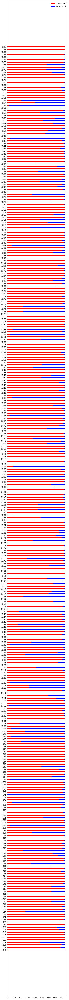

In [15]:
# https://www.kaggle.com/sudalairajkumar/simple-exploration-notebook-mercedes/notebook
zero_count_list = []
one_count_list = []
cols_list = unique_values_dict['[0, 1]']
for col in cols_list:
    zero_count_list.append((df[col]==0).sum())
    one_count_list.append((df[col]==1).sum())

N = len(cols_list)
ind = np.arange(N)
width = 0.35

plt.figure(figsize=(6,100))
p1 = plt.barh(ind, zero_count_list, width, color='red')
p2 = plt.barh(ind, one_count_list, width, left=zero_count_list, color="blue")
plt.yticks(ind, cols_list)
plt.legend((p1[0], p2[0]), ('Zero count', 'One Count'))
plt.show()

##From the above plot, we observed that, there are many variables which have very low variance. There are features also, which have constant values.

## Analyzing Target Variable 'y' time taken for testing 

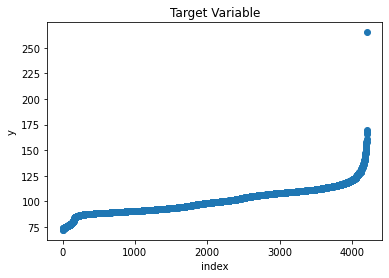

In [16]:
plt.scatter(range(df.shape[0]),np.sort(df["y"]))
plt.title("Target Variable")
plt.xlabel("index")
plt.ylabel("y")
plt.show()

In [17]:
df["y"].agg([min, max]).T

min     72.11
max    265.32
Name: y, dtype: float64

In [18]:
df["y"].describe()

count    4209.000000
mean      100.669318
std        12.679381
min        72.110000
25%        90.820000
50%        99.150000
75%       109.010000
max       265.320000
Name: y, dtype: float64

In [19]:
df["y"][df["y"]>160].value_counts().to_frame()

,y
160.87,1
167.45,1
265.32,1
169.91,1
165.52,1


In [20]:
df["y"]

0       130.81
1        88.53
2        76.26
3        80.62
4        78.02
         ...  
4204    107.39
4205    108.77
4206    109.22
4207     87.48
4208    110.85
Name: y, Length: 4209, dtype: float64

In [21]:
df_modified = df[df["y"]<160]

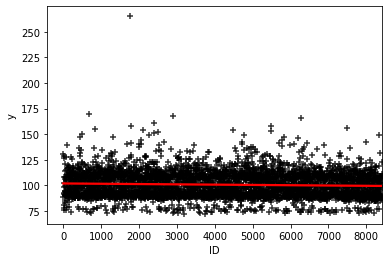

In [22]:
sns.regplot(x="ID", y="y", data=df, x_jitter=.1,marker="+",scatter_kws={"color": "black"}, line_kws={"color": "red"})

 The Above plot shows that there is a relationship between the time taken and order of tests







## Analyzing Feature columns 

In [23]:
nas=pd.DataFrame(df.isnull().sum().sort_values(ascending=False)/len(df),columns = ['percent'])
pos = nas['percent'] > 0.00
nas[pos]

,percent


In [24]:
df.isnull().sum()

ID      0
y       0
X0      0
X1      0
X2      0
       ..
X380    0
X382    0
X383    0
X384    0
X385    0
Length: 378, dtype: int64

As seen above that there is no missing value in few columns.

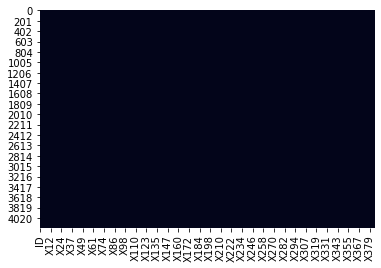

In [25]:
sns.heatmap(df.isnull(), cbar=False)

##Looking for any Duplicate rows in the dataset

In [26]:
duplicateRowsDF = df[df.duplicated()]
duplicateRowsDF


,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X26,X27,X28,X29,X30,X31,X32,X33,X34,X35,X36,X37,X38,X39,X40,...,X345,X346,X347,X348,X349,X350,X351,X352,X353,X354,X355,X356,X357,X358,X359,X360,X361,X362,X363,X364,X365,X366,X367,X368,X369,X370,X371,X372,X373,X374,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385


##There are no duplicate rows found in the dataset

In [27]:
duplicate_columns = list(df.T.index[df.T.duplicated(keep="first")].values)
duplicate_columns

['X35',
 'X37',
 'X39',
 'X76',
 'X84',
 'X93',
 'X94',
 'X102',
 'X107',
 'X113',
 'X119',
 'X122',
 'X134',
 'X146',
 'X147',
 'X172',
 'X199',
 'X213',
 'X214',
 'X216',
 'X222',
 'X226',
 'X227',
 'X232',
 'X233',
 'X235',
 'X239',
 'X242',
 'X243',
 'X244',
 'X245',
 'X247',
 'X248',
 'X253',
 'X254',
 'X262',
 'X266',
 'X268',
 'X279',
 'X289',
 'X290',
 'X293',
 'X296',
 'X297',
 'X299',
 'X302',
 'X320',
 'X324',
 'X326',
 'X330',
 'X347',
 'X360',
 'X364',
 'X365',
 'X382',
 'X385']

In [28]:
Variance = []
Variance.extend(duplicate_columns)

In [29]:
print("No of duplicate columns is",len(duplicate_columns))

No of duplicate columns is 56


Analyzing  Categorical column X4 

In [30]:
df.X4.value_counts().to_frame()

,X4
d,4205
a,2
c,1
b,1


As seen Above Column X4 contain majority 'd' Values so we can drop this column from our further analysis

## Finding features with min variance

In [31]:
#https://github.com/aditya2029/Mercedes-Benz-Greener-Manufacturer/blob/master/mercedes%20greener%20manufacturer_final_updated.ipynb
df_num = df.loc[:,df.dtypes==np.int64]
temp = []
for i in df_num.columns:
    if df[i].var()==0:
        temp.append(i)
        
print(len(temp))
print(temp)
    

12
['X11', 'X93', 'X107', 'X233', 'X235', 'X268', 'X289', 'X290', 'X293', 'X297', 'X330', 'X347']


In [32]:
#https://github.com/aditya2029/Mercedes-Benz-Greener-Manufacturer/blob/master/mercedes%20greener%20manufacturer_final_updated.ipynb
Variance.extend(temp)
Variance = list(set(Variance))
Variance.append("X4")
print(df.shape)
df_modified = df.drop(Variance, axis=1)
print(df_modified.shape)

(4209, 378)
(4209, 320)


In [33]:
print("Number of removed features: ",df.shape[1] - df_modified.shape[1])

Number of removed features:  58


Dropping Target Variable from features 

In [34]:
df_modified.shape

(4209, 320)

In [35]:
Y = df_modified["y"]

##Categorical Variables Analysis

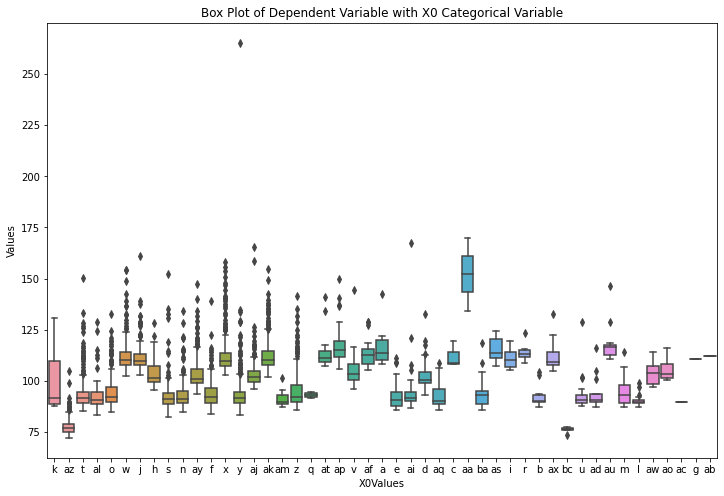

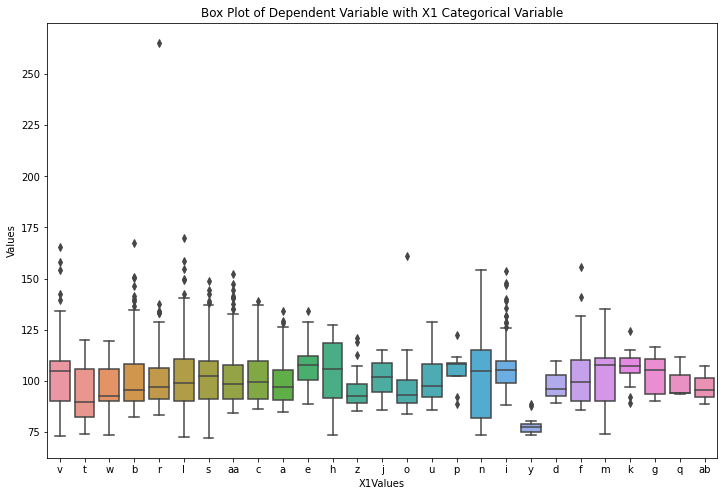

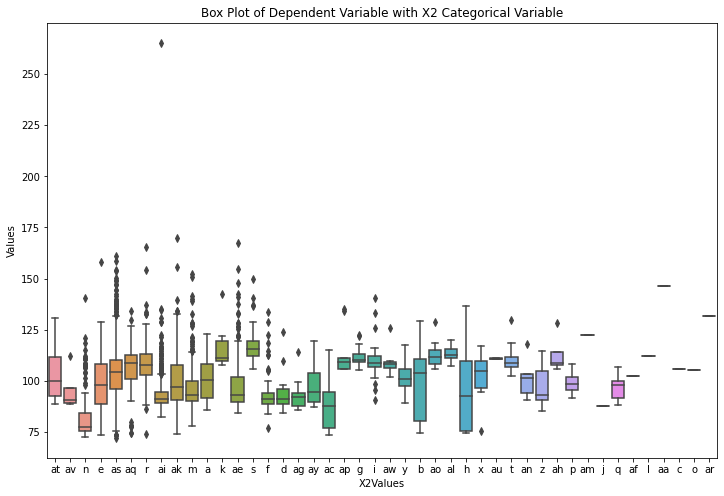

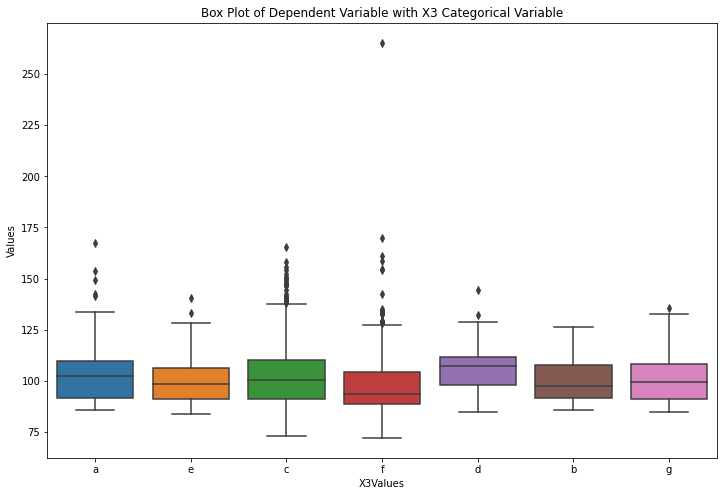

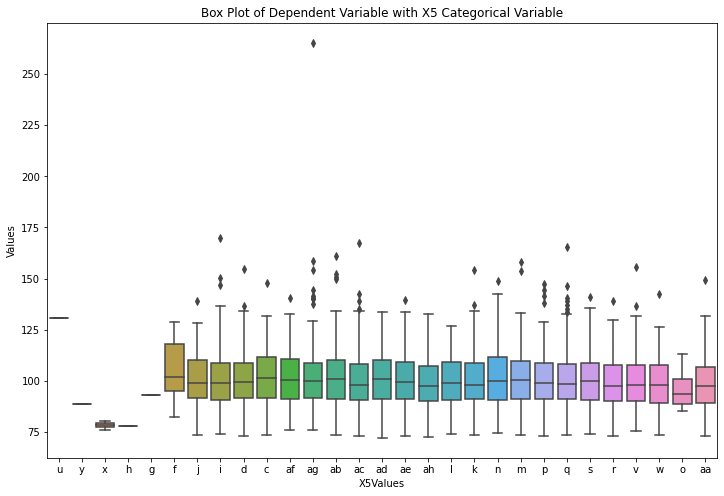

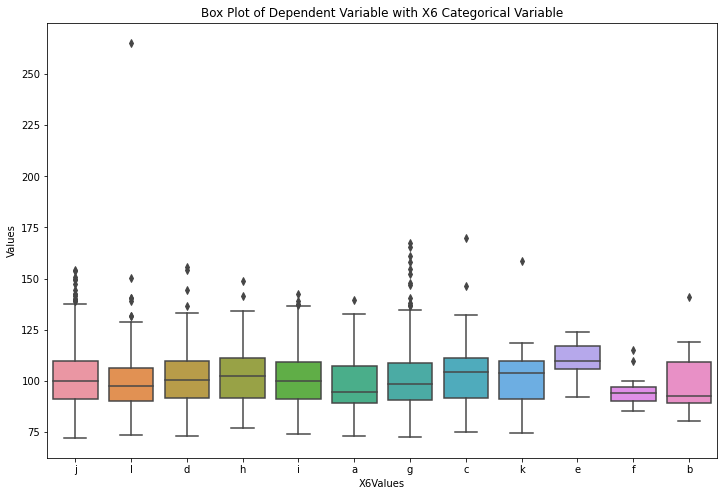

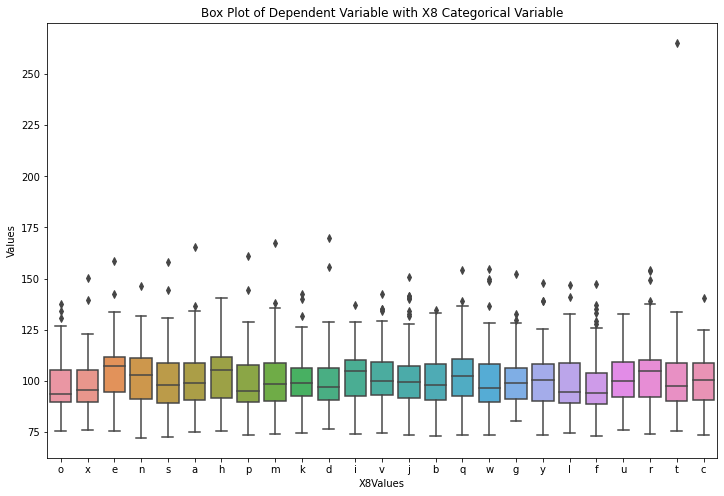

In [36]:
#https://github.com/aditya2029/Mercedes-Benz-Greener-Manufacturer/blob/master/mercedes%20greener%20manufacturer_final_updated.ipynb
for i in list(df_modified.columns):
    if(df_modified[i].dtypes==np.object):
        plt.figure(figsize=(12,8))
        sns.boxplot(y=Y,x=df_modified[i])
        plt.xlabel(i + "Values")
        plt.ylabel("Values")
        plt.title("Box Plot of Dependent Variable with "+ i + " Categorical Variable")

In [37]:
df_corr = df_modified
df_corr['y'] =Y
df_corr.head()

,ID,y,X0,X1,X2,X3,X5,X6,X8,X10,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X26,X27,X28,X29,X30,X31,X32,X33,X34,X36,X38,X40,X41,X42,X43,X44,X45,...,X339,X340,X341,X342,X343,X344,X345,X346,X348,X349,X350,X351,X352,X353,X354,X355,X356,X357,X358,X359,X361,X362,X363,X366,X367,X368,X369,X370,X371,X372,X373,X374,X375,X376,X377,X378,X379,X380,X383,X384
0,0,130.81,k,v,at,a,u,j,o,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,6,88.53,k,t,av,e,y,l,o,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,7,76.26,az,w,n,c,x,j,x,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,9,80.62,az,t,n,f,x,l,e,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,13,78.02,az,v,n,f,h,d,n,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


Creating a Pearson correlation heatmap

In [38]:

corr_matrix= df_corr.corr()
corr_matrix.round(2).style.background_gradient(cmap='coolwarm')

In [39]:
#filteredDf = corr_matrix[((corr_matrix >= .9)) & (corr_matrix !=1.000)]
#plt.figure(figsize=(30,10))
#sns.heatmap(filteredDf, annot=True, cmap="Reds")
#plt.show()#

In [40]:
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# This code iterates through our columns and gets the index of any that have a correlation > 0.95
# Call the variable to_drop, get the columns of our 'upper' variable, make sure the threshold is 0.95.
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

In [41]:
print('Features selected to drop include:',to_drop)

Features selected to drop include: ['X54', 'X90', 'X120', 'X129', 'X137', 'X140', 'X162', 'X198', 'X215', 'X217', 'X249', 'X250', 'X263', 'X264', 'X311', 'X314', 'X328', 'X348', 'X352', 'X358', 'X362', 'X363', 'X367', 'X368', 'X370', 'X371', 'X378']


The Above Features are having high correlation and multicollinearity

In [42]:
#pair plots
#g =sns.pairplot(df_corr)

In [43]:
df_modified.drop(columns=["y"], axis=1, inplace=True)
X = df_modified

In [44]:
X = X.drop(to_drop,axis=1)

In [45]:
X.shape

(4209, 292)

In [46]:
object_features=X.dtypes[X.dtypes=='object'].index
int_features=X.dtypes[X.dtypes=='int64'].index

Test Data Processing

In [47]:
test_df = pd.read_csv('/content/drive/MyDrive/Mercedez_Benz_Capstone/test/test.csv')

In [48]:
print(test_df.shape)
test_df.head()

(4209, 377)


,ID,X0,X1,X2,X3,X4,X5,X6,X8,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X26,X27,X28,X29,X30,X31,X32,X33,X34,X35,X36,X37,X38,X39,X40,X41,...,X345,X346,X347,X348,X349,X350,X351,X352,X353,X354,X355,X356,X357,X358,X359,X360,X361,X362,X363,X364,X365,X366,X367,X368,X369,X370,X371,X372,X373,X374,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,1,az,v,n,f,d,t,a,w,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,2,t,b,ai,a,d,b,g,y,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,3,az,v,as,f,d,a,j,j,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,4,az,l,n,f,d,z,l,n,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,5,w,s,as,c,d,y,i,m,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [49]:
#ID = test_df["ID"]
#test_df.drop(columns=["ID"], inplace=True)

## Label Encoding Categorical Variables in Train and Test Data

In [50]:
from sklearn.preprocessing import LabelEncoder
for i in object_features:
    le=LabelEncoder()
    le.fit(list(X[i].values)+ list(test_df[i].values))
    X[i]=le.transform(list(X[i].values))
    test_df[i]=le.transform(list(test_df[i].values))

Since the Categorical Features are not ordinal we are using Label Encoding, also using ONE HOT Encoding will lead to increase in cardinality

In [51]:
X.shape

(4209, 292)

In [52]:
test_df = test_df[X.columns]

In [53]:
test_df.shape

(4209, 292)

In [54]:
X.head()

,ID,X0,X1,X2,X3,X5,X6,X8,X10,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X26,X27,X28,X29,X30,X31,X32,X33,X34,X36,X38,X40,X41,X42,X43,X44,X45,X46,...,X327,X329,X331,X332,X333,X334,X335,X336,X337,X338,X339,X340,X341,X342,X343,X344,X345,X346,X349,X350,X351,X353,X354,X355,X356,X357,X359,X361,X366,X369,X372,X373,X374,X375,X376,X377,X379,X380,X383,X384
0,0,37,23,20,0,27,9,14,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,...,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
1,6,37,21,22,4,31,11,14,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
2,7,24,24,38,2,30,9,23,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,9,24,21,38,5,30,11,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,13,24,23,38,5,14,3,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


## Splitting Data Train-Test Split

In [55]:
y = Y.ravel()

In [56]:
X_train, X_val, y_train, y_val= train_test_split(X,y, test_size=0.30, random_state=1)

## Scaling Data

In [57]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train))
X_val = pd.DataFrame(scaler.transform(X_val))
test_df_sc = pd.DataFrame(scaler.transform(test_df))

## Models Preparation

In [58]:

from sklearn.metrics import r2_score

Using Linear Regression as a Base Model

In [59]:
from sklearn.linear_model import LinearRegression

In [60]:
lm = LinearRegression()
model = lm.fit(X_train,y_train)

In [61]:
y_pred = model.predict(X_train)

In [62]:
print("Training R^^2 Value is :",r2_score(y_train,y_pred))

Training R^^2 Value is : 0.5864124067509084


In [63]:
y_pred_val = model.predict(X_val)
print("Testing R^^2 Value is :",r2_score(y_val,y_pred_val))

Testing R^^2 Value is : -2.9232454977427823e+20


In [64]:
from sklearn.linear_model import LassoCV, RidgeCV, HuberRegressor, ElasticNetCV
from sklearn import metrics

## Using LassoCV Model

In [65]:
lasso = LassoCV(max_iter=9999)
lasso.fit(X_train, y_train)
y_pred = lasso.predict(X_train)
y_pred_val = lasso.predict(X_val)
print('train', metrics.r2_score(y_train, y_pred), 'val', metrics.r2_score(y_val, y_pred_val))

train 0.5610726091102771 val 0.6009022127733292


## Using Ridge CV

In [66]:
ridge = RidgeCV()
ridge.fit(X_train, y_train)
y_pred = ridge.predict(X_train)
y_pred_val = ridge.predict(X_val)
print('train', metrics.r2_score(y_train, y_pred), 'val', metrics.r2_score(y_val, y_pred_val))

train 0.5854112723882883 val 0.5773238018727894


## Using EnetCV

In [67]:
enet = ElasticNetCV()
enet.fit(X_train, y_train)
y_pred = enet.predict(X_train)
y_pred_val = enet.predict(X_val)
print('train', metrics.r2_score(y_train, y_pred), 'val', metrics.r2_score(y_val, y_pred_val))

train 0.5630133965343742 val 0.5973598697059312


## Using Random Forest Regressor

In [68]:
from sklearn.ensemble import RandomForestRegressor

In [69]:

rf = RandomForestRegressor(max_depth=8, n_estimators=100,min_samples_leaf=10, min_samples_split= 10)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_train)
y_pred_val = rf.predict(X_val)
print('train', metrics.r2_score(y_train, y_pred), 'val', metrics.r2_score(y_val, y_pred_val))

train 0.6115086781866135 val 0.6081754529552178


In [70]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
param_grid={
        'n_estimators': range(50,250,100), 
        'min_samples_leaf': range(10,20,10), 
        'min_samples_split': range(10,20,10),  
        'max_depth': range(5,30,10)       
    }
cv = KFold(n_splits=5, shuffle=True, random_state=40)
gridSearch = GridSearchCV(estimator=RandomForestRegressor(), scoring='r2',cv=cv,param_grid=param_grid)
result = gridSearch.fit(X_train, y_train)
print("Best Score " + str(result.best_score_)+" with paramter "+ str(result.best_params_))

Best Score 0.548988673372376 with paramter {'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 10, 'n_estimators': 150}


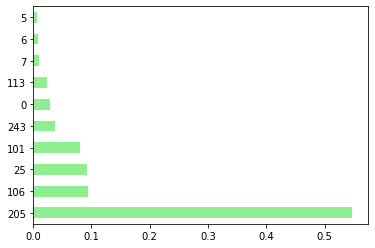

In [71]:
importances_rf = pd.Series(rf.feature_importances_, index = X_train.columns)
sorted_importances_rf = importances_rf.sort_values().nlargest(10)
sorted_importances_rf.plot(kind='barh', color='lightgreen'); plt.show()

## As seen Above Features X205,X106,X25,X101 have more importances

## Using XGboost Regression Model

In [72]:
from xgboost import XGBRegressor,plot_importance
xg_reg=XGBRegressor(max_depth=2, min_child_weight=4, reg_lambda=1000, gamma = 100)
xg_reg.fit(X_train, y_train)
y_pred = xg_reg.predict(X_train)
y_pred_val = xg_reg.predict(X_val)
print('train', metrics.r2_score(y_train, y_pred), 'val', metrics.r2_score(y_val, y_pred_val))

[09:23:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
train 0.5500900544430485 val 0.6114268158192643


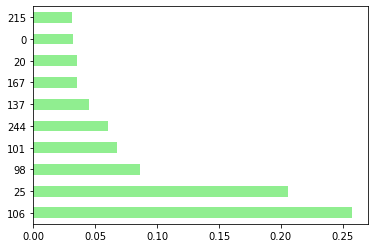

In [73]:
importances_rf = pd.Series(xg_reg.feature_importances_, index = X_train.columns)
sorted_importances_rf = importances_rf.sort_values().nlargest(10)
sorted_importances_rf.plot(kind='barh', color='lightgreen'); plt.show()

## In XGboost Models we found out that Feature X106,X25,X98 are more important

## Model Summaries

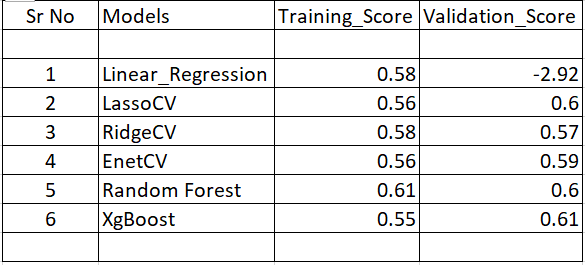

Comparing the models it is found out that XGboost model has a better Validation Accuracy amongst other Models hence using XGBoost models to predict target variable'y' 

In [75]:
pred = xg_reg.predict(test_df_sc)

In [76]:
output = pd.DataFrame()

output['ID'] = test_df['ID']
output['y']  = pred

In [77]:
output.to_csv("submissions.csv",index=False)

In [78]:
output.head()

,ID,y
0,1,79.325478
1,2,94.293259
2,3,79.456490
3,4,79.325478
4,5,112.259827


## After Submission of the predicted Target value in kaggle have got test Public score as 0.54592